In [1]:
import os, sys

sys.path.append('/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages')

import dicom
import math
import glob
import numpy as np
import matplotlib.pyplot as plt

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/dicom/__init__.py:53: UserWarning: 
This code is using an older version of pydicom, which is no longer 
maintained as of Jan 2017.  You can access the new pydicom features and API 
by installing `pydicom` from PyPI.
See 'Transitioning to pydicom 1.x' section at pydicom.readthedocs.org 
for more information.

  warnings.warn(msg)


In [2]:
dicom_dir = os.path.join(os.getcwd(),'PHANTOM^DC.MP-Mk4.0.20180405_DC.PHANTOM_CT_2018-04-05_151512_RT^CYBERKNIFE.BRAIN.(Adult)_CK.Brain..0.6..H50s_n201__00000')
n_dicoms = len(os.listdir(dicom_dir))

dicom_list = glob.glob(os.path.join(dicom_dir,'*.dcm'))
dicom_list.sort()

ref_dcm = dicom.read_file(dicom_list[0])

(nx, ny, nz) = (
    int(ref_dcm.Columns),
    int(ref_dcm.Rows),
    int(n_dicoms)
)

(dx, dy, dz) = (
    float(ref_dcm.PixelSpacing[0]),
    float(ref_dcm.PixelSpacing[1]),
    float(ref_dcm.SliceThickness)
)

vol = np.ndarray((nx, ny, nz), dtype=ref_dcm.pixel_array.dtype)
for zi, dicom_fname in enumerate(dicom_list):
    ds = dicom.read_file(dicom_fname)
    vol[:, :, zi] = ds.pixel_array

<Figure size 1440x1440 with 0 Axes>

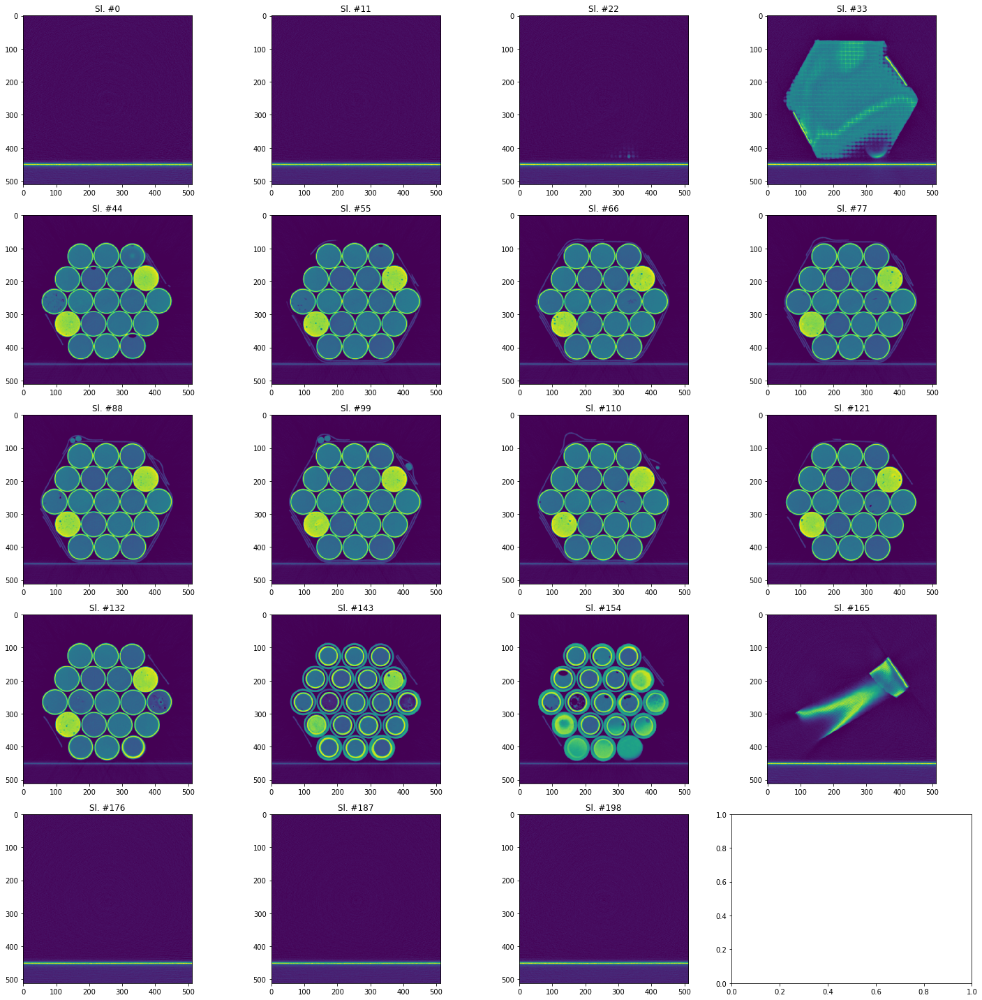

In [3]:
# plot a couple slices (sanity check)

plt.close()
plt.figure(figsize=(20.0, 20.0))

slices = np.arange(0, nz, np.ceil(nz/20), dtype=np.uint8)
#print((nx,ny,nz),axial_planes)
fig, ax = plt.subplots(5, 4, figsize=(20.0, 20.0))
for pl, zi in enumerate(slices):
    ai=ax[int(pl/4)][int(pl%4)]
    ai.imshow(vol[:,:,zi])
    ai.set_title('Sl. #{:d}'.format(zi))

fig.tight_layout()
fig.patch.set_facecolor('#ffffff')
plt.show()

fig.savefig('ia_rf1-20000.png')

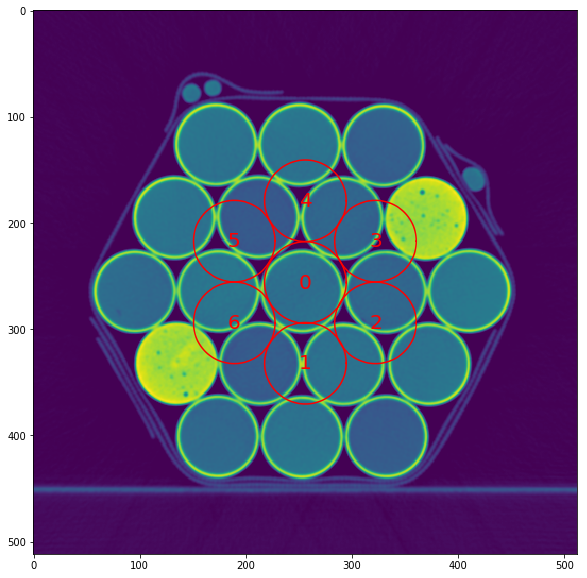

In [13]:
import cv2
from IPython.display import display, HTML
import base64

plt.close()
fig = plt.figure(figsize=(10.0, 10.0))

sli = int(nz/2)
scl_slice = (vol[:,:,sli] - np.min(vol[:,:,sli]))/(np.max(vol[:,:,sli]) - np.min(vol[:,:,sli]))
plt.imshow(scl_slice)

rc = 13.5 # mm
cx0 = int(nx/2)
cy0 = int(ny/2)

#plt.plot(cx0, cy0, 'rx')
plt.text(cy0, cx0, '{:d}'.format(0), fontdict = {
    'color': 'red',
    'fontsize': 20,
    'horizontalalignment' : 'center',
    'verticalalignment' : 'center'
})
th = np.linspace(0.0, 2*np.pi, 100)
xx = rc/dx * np.cos(th) + cy0
yy = rc/dy * np.sin(th) + cx0
plt.plot(xx, yy, 'r')


# dth = np.pi / 6
dth = 0
for ci in range(6):
    thi = dth + ci * np.pi / 3.0
    cx = int(((cx0 * dx) + (2 * rc * np.cos(thi)))/dx)
    cy = int(((cy0 * dy) + (2 * rc * np.sin(thi)))/dy)
    #plt.plot(cx, cy, 'rx')
    th = np.linspace(0.0, 2*np.pi, 100)
    xx = rc/dy * np.cos(th) + cy
    yy = rc/dx * np.sin(th) + cx
    plt.plot(xx, yy, 'r')
    plt.text(cy, cx, '{:d}'.format(ci+1), fontdict = {
        'color': 'red',
        'fontsize': 20,
        'horizontalalignment' : 'center',
        'verticalalignment' : 'center'
    })
    
plt.show()
fig.savefig('ia_rf1-20000_sl-{:d}.png'.format(sli))

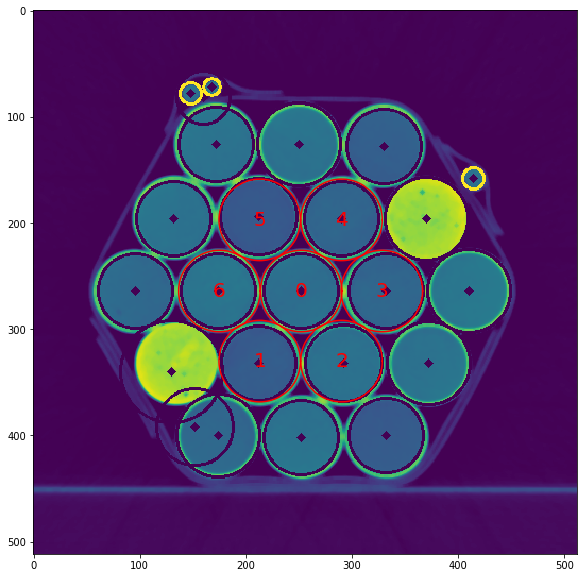

In [5]:
# Automatically find proper rotation and translation params for ROIs.
# This uses a hough circle transform algorithm, and correctness should be
# visually verified below.
plt.close()

img = scl_slice*255.0
img = img.astype(np.uint8)
img = cv2.medianBlur(img,5)

circles = cv2.HoughCircles(img,cv2.HOUGH_GRADIENT,1,20,
                            param1=50,param2=30,minRadius=int(rc-50),maxRadius=int(rc+50))
circles = np.uint16(np.around(circles))

retval, image = cv2.threshold(img, 50, 255, cv2.THRESH_BINARY)
target_circles = cv2.HoughCircles(image,cv2.HOUGH_GRADIENT,1,5,
                            param1=50,param2=10,minRadius=int(rc-30),maxRadius=int(rc))
target_circles = np.uint16(np.around(target_circles))

for i in circles[0,:]:
    # draw the outer circle
    cv2.circle(img,(i[0],i[1]),i[2],(0,255,0),2)
    # draw the center of the circle
    cv2.circle(img,(i[0],i[1]),2,(0,0,255),3)
    
for i in target_circles[0,:]:
    # draw the outer circle
    cv2.circle(img,(i[0],i[1]),i[2],(255,255,0),2)
    # draw the center of the circle
    cv2.circle(img,(i[0],i[1]),2,(0,0,255),3)
    

fig = plt.figure(figsize=(10.0, 10.0))

# Initial parameters:
cx0 = int(nx/2)
cy0 = int(ny/2)
# dth = np.pi / 6
dth = -np.pi / 6

# Central ROI circle assumed to be closest to initial param center:
try:
    circle_coords = circles[0,:]
    idx = (np.abs( np.square(circle_coords[:,0]-cx0) + np.square(circle_coords[:,1]-cy0) )).argmin()
    center_circle = circle_coords[idx]
    cx0 = center_circle[1]
    cy0 = center_circle[0]
except:
    raise Exception('No ROIs detected... stopping.')
    
centX = cx0
centY = cy0


# # Now automatically ROTATE ROIs using target capsules (if visible):
# if (len(target_circles[0,:]) == 3):
#     targ_coords = target_circles[0,:]
#     min_centers = [] # indices of two circles that are close to one another.
#     min_dist = sys.maxsize
#     for i in range(len(targ_coords)): # efficient since len = 3
#         for j in range(len(targ_coords)):
#             if (i != j):
#                 dx2 = float(targ_coords[i,0]) - float(targ_coords[j,0])
#                 dy2 = float(targ_coords[i,1]) - float(targ_coords[j,1])
#                 dist = np.square(dx2) + np.square(dy2)
#                 if (dist<min_dist):
#                     min_dist = dist
#                     indices = [i,j]
#                     cent = np.array([(targ_coords[i,0],targ_coords[i,1]),(targ_coords[j,0],targ_coords[j,1])])
#     # find coordinate of midpoint between smaller circles:
#     two_midX = min(cent[0,0],cent[1,0]) + abs((int(cent[0,0]) - int(cent[1,0]))//2)
#     two_midY = min(cent[0,1],cent[1,1]) + abs((int(cent[0,1]) - int(cent[1,1]))//2)
#     # find coord of third circle:
#     index = [n for n in [0,1,2] if n not in indices][0]
#     singleX = targ_coords[index,0]
#     singleY = targ_coords[index,1]  
    
#     y_diff = centY - two_midY
#     x_diff = two_midX - centX
#     print(y_diff, x_diff)
#     dth = np.tan(y_diff / x_diff)
# else:
#     print("Rotation cannot be performed automatically!")




# Continue by plotting:
plt.text(cy0, cx0, '{:d}'.format(0), fontdict = {
    'color': 'red',
    'fontsize': 20,
    'horizontalalignment' : 'center',
    'verticalalignment' : 'center'
})
th = np.linspace(0.0, 2*np.pi, 100)
xx = rc/dx * np.cos(th) + cy0
yy = rc/dy * np.sin(th) + cx0
plt.plot(xx, yy, 'r')

for ci in range(6):
    thi = dth + ci * np.pi / 3.0
    cx = int(((cx0 * dx) + (2 * rc * np.cos(thi)))/dx)
    cy = int(((cy0 * dy) + (2 * rc * np.sin(thi)))/dy)
    #plt.plot(cx, cy, 'rx')
    th = np.linspace(0.0, 2*np.pi, 100)
    xx = rc/dy * np.cos(th) + cy
    yy = rc/dx * np.sin(th) + cx
    plt.plot(xx, yy, 'r')
    plt.text(cy, cx, '{:d}'.format(ci+1), fontdict = {
        'color': 'red',
        'fontsize': 20,
        'horizontalalignment' : 'center',
        'verticalalignment' : 'center'
    })
    

plt.imshow(img)
plt.show()

In [6]:
# Generate ROIs

# Container dimensions
nc = 18
rc = 13.5 # Container radius (mm)
hc = 95.25/2 # Container height (mm) NOTE: outer dimensions

# ROI dimensions (use the approx. center)
rr = rc * 0.25
hr = hc * 0.75

# image center
im_cx = nx * dx / 2.0
im_cy = ny * dy / 2.0
im_cz = nz * dz / 2.0

# some fudge factors
del_th = -np.pi / 6 # angle offset
cz0 = im_cz # center of 10-dram vials is at approx. axial slice 35

# Commented to use automatic ROI algorithm:
# cy0 = im_cy + (-2.0 * dy)
# cx0 = im_cx + (9.0 * dx)
cx0 = centX * dx
cy0 = centY * dy

# ROI labels
roi_labels = [
    '0: (D01) Deuterium Oxide 10%',
    '1: (A03.1) Isopropyl Alcohol',
    '2: (A03.2) Isopropyl Alcohol',
    '3: (W01.1) Water',
    '4: (W01.2) Water',
    '5: (A06.1) Coconut Oil',
    '6: (A06.2) Coconut Oil',
    '7: (A04.1) Propargyl Alcohol',
    '8: (A04.2) Propargyl Alcohol',
    '9: (A02.1) Acetone',
    '10: (A02.2) Acetone',
    '11: (A05.1) Gelatin',
    '12: (A05.2) Gelatin',
    '13: (D02.2) Deuterium Oxide 5%',
    '14: (D02.1) Deuterium Oxide 5%',
    '15: (D03.1) Deuterium Oxide ~2%',
    '16: (D03.2) Deuterium Oxide ~2%',
    '17: (B01.1)',
    '18: (B01.2)',
]

import roi

roi_info = []

# Center container:
roi_info.append({})
roi_info[0]['cx'] = cx0
roi_info[0]['cy'] = cy0
roi_info[0]['cz'] = cz0

roi_info[0]['ht'] = hr
roi_info[0]['rd'] = rr

roi_info[0]['mask'] = roi.CylinderROI(
    roi_info[0]['cx'],
    roi_info[0]['cy'],
    roi_info[0]['cz'],
    roi_info[0]['ht'],
    roi_info[0]['rd']
).generate_mask(nx, ny, nz, dx, dy, dz)

roi_info[0]['label'] = roi_labels[0]

# Other containers:
for ci in range(nc):
    if (ci < 12):
        if (ci % 2 == 0):
            thi = del_th + np.floor(ci/2) * np.pi / 3.0
            del_cx = 2 * rc * np.cos(thi)
            del_cy = 2 * rc * np.sin(thi)
        else:
            thi = np.pi + del_th + np.floor(ci/2) * np.pi / 3.0
            del_cx = 4 * rc * np.cos(thi)
            del_cy = 4 * rc * np.sin(thi)
    else:
        if (ci % 2 == 0):
            thi = np.pi/6.0 + del_th + np.floor(ci/2) * np.pi / 3.0
            del_cx = 2 * rc * np.cos(thi) * 2 * np.cos(np.pi / 6.0)
            del_cy = 2 * rc * np.sin(thi) * 2 * np.cos(np.pi / 6.0)
        else:
            thi = np.pi/6.0 + np.pi + del_th + np.floor(ci/2) * np.pi / 3.0
            del_cx = 2 * rc * np.cos(thi) * 2 * np.cos(np.pi / 6.0)
            del_cy = 2 * rc * np.sin(thi) * 2 * np.cos(np.pi / 6.0)
    
    roi_info.append({})
    roi_info[ci+1]['cx'] = cx0 + del_cx
    roi_info[ci+1]['cy'] = cy0 + del_cy
    roi_info[ci+1]['cz'] = cz0
    
    roi_info[ci+1]['ht'] = hr
    roi_info[ci+1]['rd'] = rr
    
    roi_info[ci+1]['mask'] = roi.CylinderROI(
        roi_info[ci+1]['cx'],
        roi_info[ci+1]['cy'],
        roi_info[ci+1]['cz'],
        roi_info[ci+1]['ht'],
        roi_info[ci+1]['rd']
    ).generate_mask(nx, ny, nz, dx, dy, dz)
    
    roi_info[ci+1]['label'] = roi_labels[ci+1]


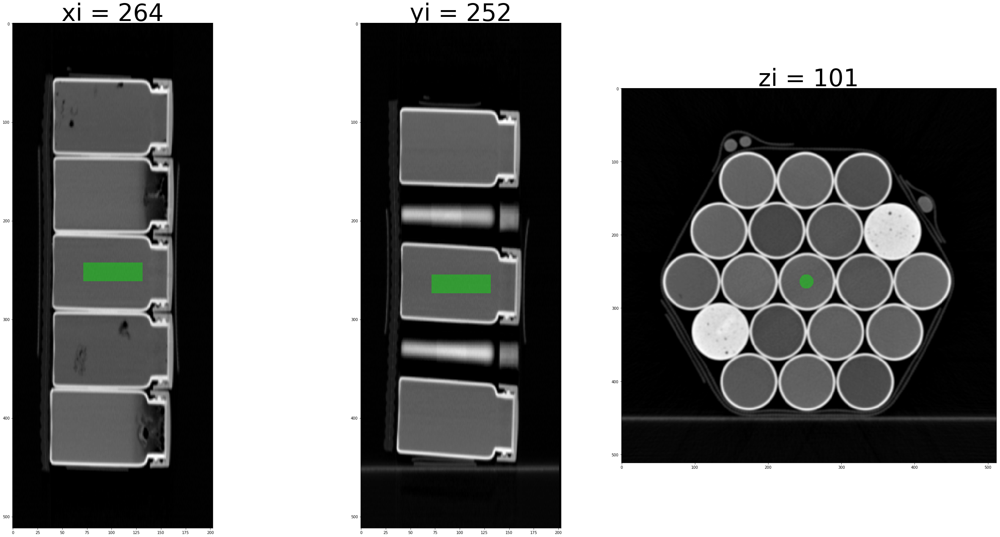

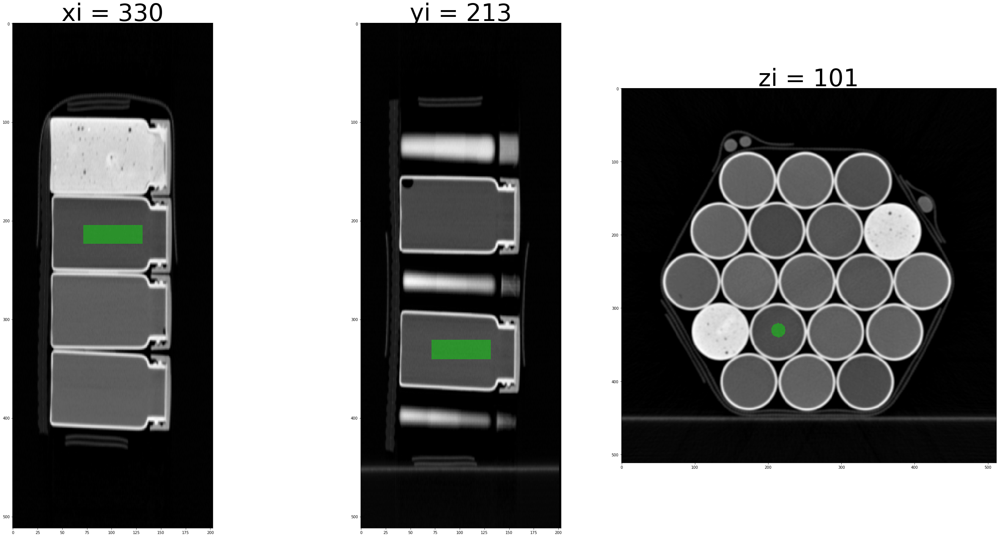

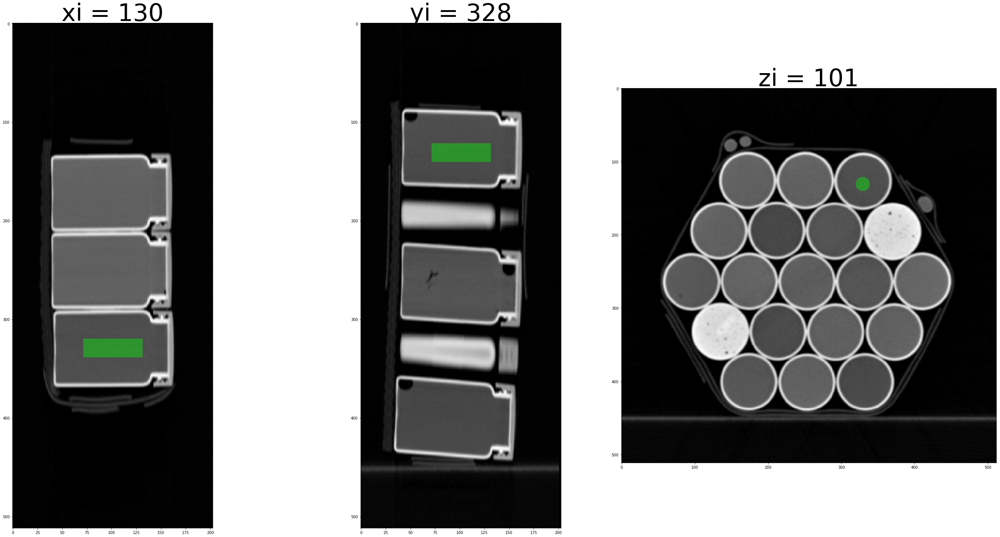

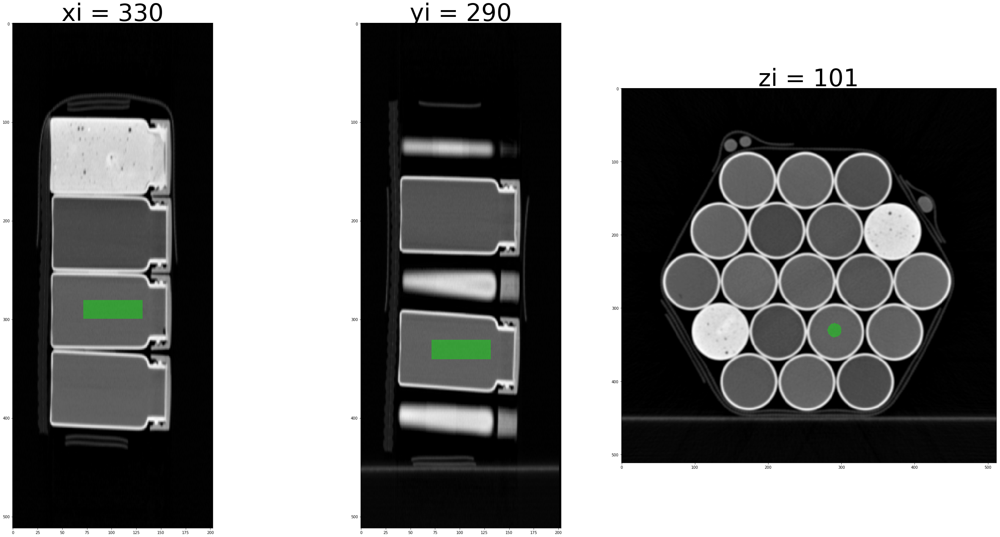

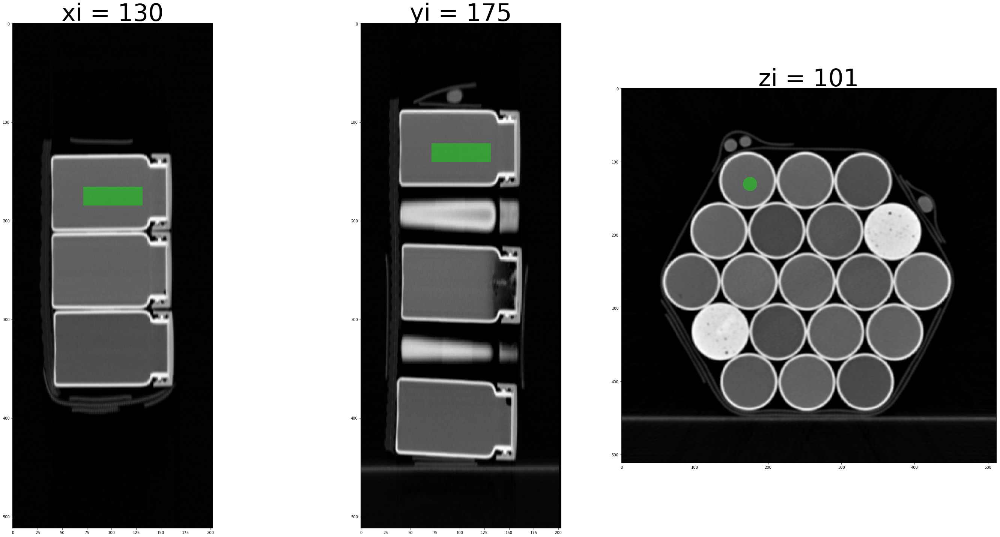

...

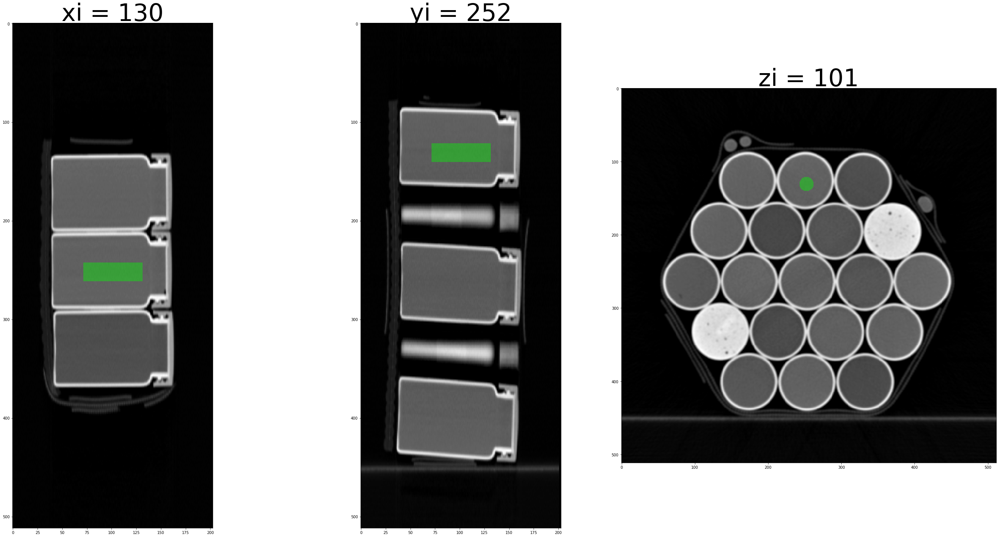

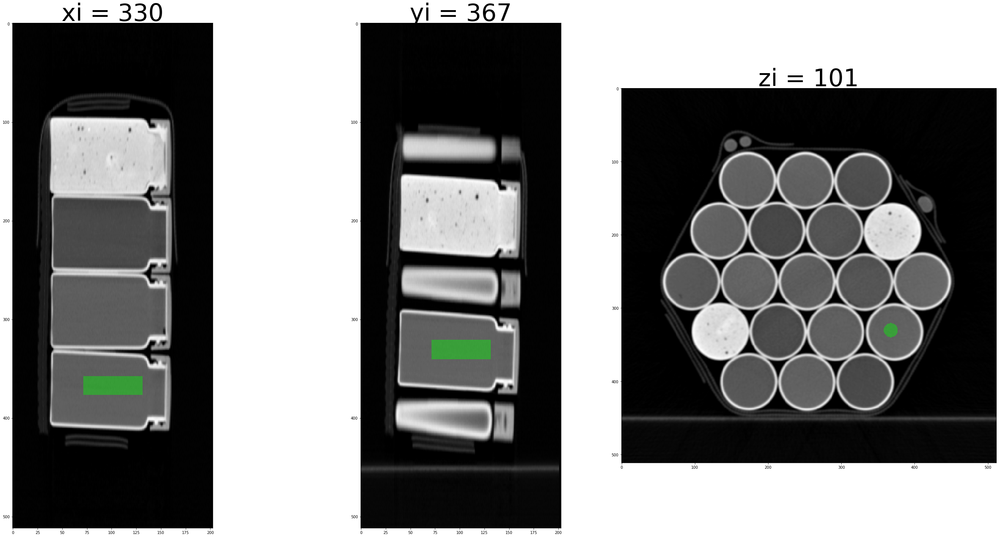

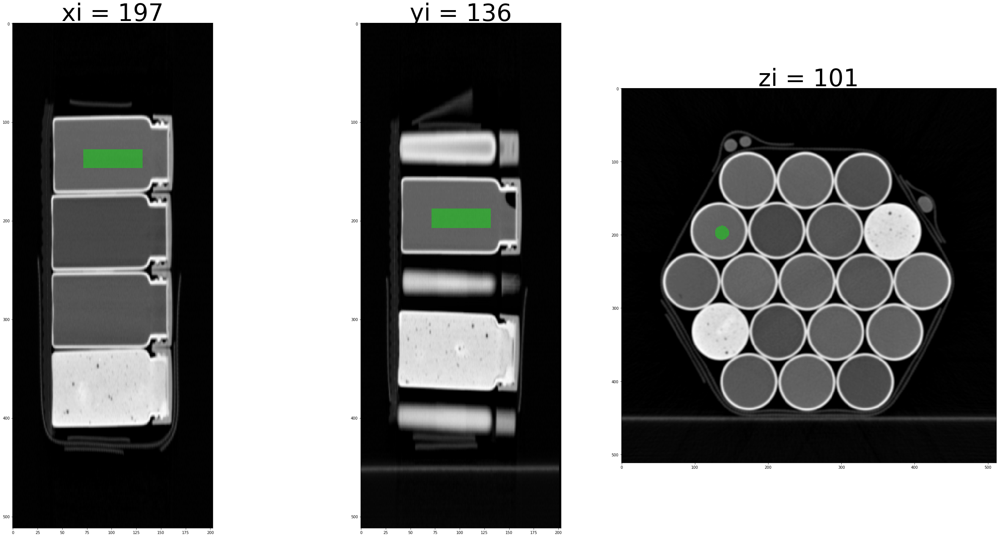

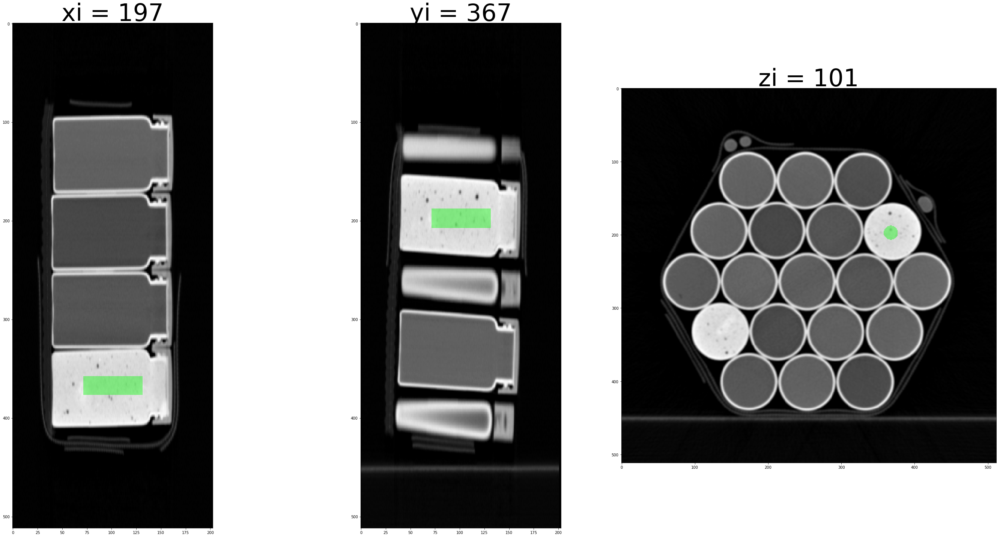

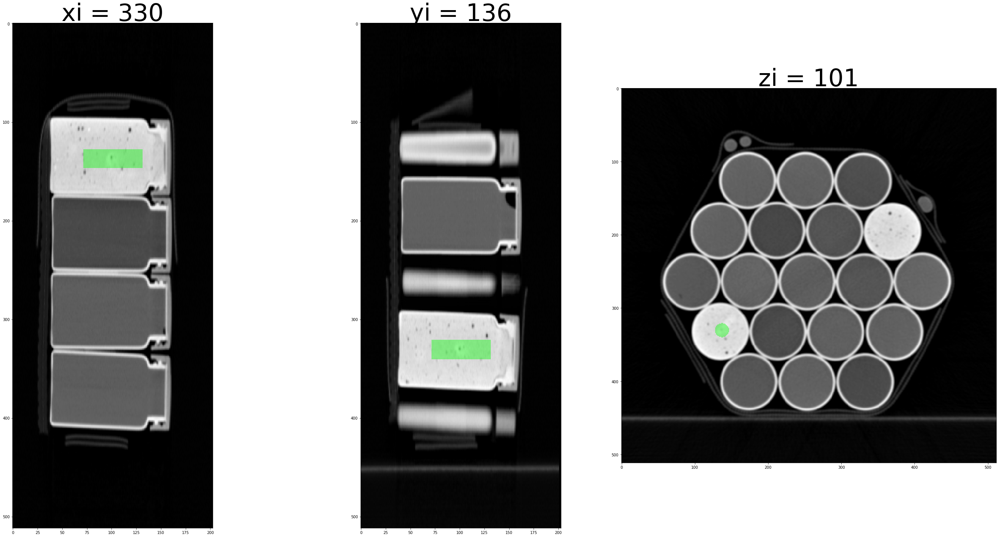

In [7]:
# Plot each ROI through the center

plt.close()
alpha = 0.4

for ci, roi in enumerate(roi_info):
    fig, ax = plt.subplots(1, 3, figsize=(40.0, 20.0))
    
    # Plot a slice in each axis through the ROI center
    cx, cy, cz = (
        int(roi['cx']/dx),
        int(roi['cy']/dy),
        int(roi['cz']/dz)
    )
        
    roi_data = np.zeros((nx, ny, nz, 4), dtype=np.float)
    roi_data[:,:,:,1] = roi['mask']
    roi_data[:,:,:,3] = alpha * roi['mask']
    
    ax[0].imshow(vol[cx,:,:], cmap=plt.cm.gray)
    ax[0].imshow(roi_data[cx,:,:,:])
    ax[0].set_title('xi = {:d}'.format(cx), fontsize=64)
    
    ax[1].imshow(vol[:,cy,:], cmap=plt.cm.gray)
    ax[1].imshow(roi_data[:,cy,:,:])
    ax[1].set_title('yi = {:d}'.format(cy), fontsize=64)
    
    ax[2].imshow(vol[:,:,cz], cmap=plt.cm.gray)
    ax[2].imshow(roi_data[:,:,cz,:])
    ax[2].set_title('zi = {:d}'.format(cz), fontsize=64)
    
    fig.patch.set_facecolor('white')
    fig.tight_layout()

plt.show()

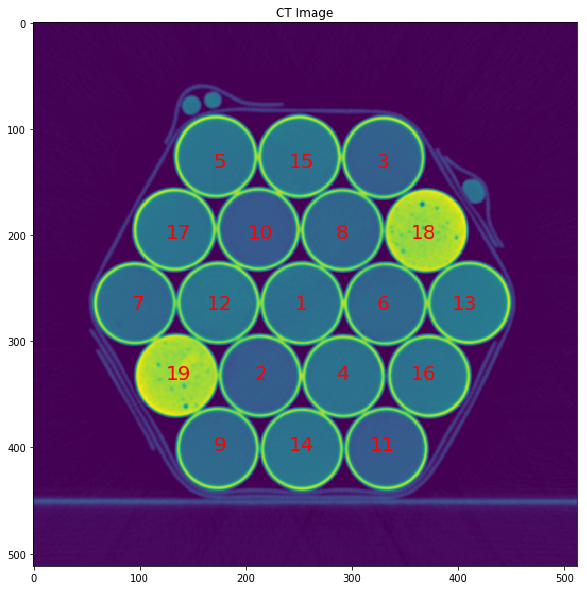

In [8]:
plt.close()
fig = plt.figure(figsize=(10.0, 10.0))

sli = int(nz/2)
scl_slice = (vol[:,:,sli] - np.min(vol[:,:,sli]))/(np.max(vol[:,:,sli]) - np.min(vol[:,:,sli]))
plt.imshow(scl_slice)

for ci,roi in enumerate(roi_info):
    cx = roi['cx']/dx
    cy = roi['cy']/dy
    #plt.plot(cx, cy, 'rx')
    th = np.linspace(0.0, 2*np.pi, 100)
    xx = rc/dy * np.cos(th) + cy
    yy = rc/dx * np.sin(th) + cx
    #plt.plot(xx, yy, 'r')
    plt.text(cy, cx, '{:d}'.format(ci+1), fontdict = {
        'color': 'red',
        'fontsize': 20,
        'horizontalalignment' : 'center',
        'verticalalignment' : 'center'
    })

fig.patch.set_facecolor('white')
plt.title('CT Image')
plt.show()

fig.savefig('CT_labeled_slice.svg')


In [9]:
# Compute Avg HU within each ROI

for roi in roi_info:
    roi['vox_HU'] = []
    roi['vox_CT_num'] = []
    for zi in range(nz):
        for yi in range(ny):
            for xi in range(nx):
                if (roi['mask'][xi, yi, zi]):
                    roi['vox_HU'].append(vol[xi, yi, zi] - 1000.0)
                    roi['vox_CT_num'].append(vol[xi,yi,zi])
    
    roi['vox_HU'] = np.array(roi['vox_HU'], dtype=np.float)
    roi['vox_CT_num'] = np.array(roi['vox_CT_num'], dtype=np.float)
    roi['mean_HU'] = np.mean(roi['vox_HU'])
    roi['mean_CT_num'] = np.mean(roi['vox_CT_num'])
    
    print('ROI: {:s}\n\t{:d} datapoints...\n\tAvg. HU = {:10.2f}\n\tAvg. CT num = {:10.2f}\n'.format(roi['label'], roi['vox_HU'].size, np.mean(roi['vox_HU']), roi['mean_CT_num']))


ROI: 0: (D01) Deuterium Oxide 10%
	17580 datapoints...
	Avg. HU =     -12.38
	Avg. CT num =     987.62

ROI: 1: (A03.1) Isopropyl Alcohol
	17340 datapoints...
	Avg. HU =    -185.57
	Avg. CT num =     814.43

ROI: 2: (A03.2) Isopropyl Alcohol
	17400 datapoints...
	Avg. HU =    -164.11
	Avg. CT num =     835.89

ROI: 3: (W01.1) Water
	17340 datapoints...
	Avg. HU =      27.39
	Avg. CT num =    1027.39

ROI: 4: (W01.2) Water
	17400 datapoints...
	Avg. HU =      39.62
	Avg. CT num =    1039.62

ROI: 5: (A06.1) Coconut Oil
	17340 datapoints...
	Avg. HU =     -87.26
	Avg. CT num =     912.74

ROI: 6: (A06.2) Coconut Oil
	17160 datapoints...
	Avg. HU =     -53.73
	Avg. CT num =     946.27

ROI: 7: (A04.1) Propargyl Alcohol
	17340 datapoints...
	Avg. HU =     -87.36
	Avg. CT num =     912.64

ROI: 8: (A04.2) Propargyl Alcohol
	17400 datapoints...
	Avg. HU =     -72.44
	Avg. CT num =     927.56

ROI: 9: (A02.1) Acetone
	17340 datapoints...
	Avg. HU =    -227.79
	Avg. CT num =     772.21

ROI: 1

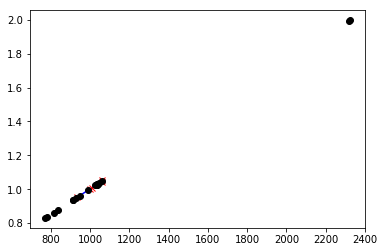

In [10]:
import json

with open('density_reference_table.json','r') as dref:
    dens_ref = json.loads(dref.read())

calc_electron_density = np.poly1d(
    np.polyfit(
        [dd['ct_num'] for dd in dens_ref],
        [dd['rel_elec_dens'] for dd in dens_ref],
        1
    )
)

calc_physical_density = np.poly1d(
    np.polyfit(
        [dd['ct_num'] for dd in dens_ref],
        [dd['physical_dens'] for dd in dens_ref],
        1
    )
)

plt.close()
five_pct = 0.05 * (dens_ref[-1]['ct_num'] - dens_ref[0]['ct_num'])
line_x = np.linspace(dens_ref[0]['ct_num']-five_pct,
                     dens_ref[-1]['ct_num']+five_pct, 10)
plt.plot(line_x, calc_electron_density(line_x), 'b--')
plt.plot([dd['ct_num'] for dd in dens_ref],
         [dd['rel_elec_dens'] for dd in dens_ref], 'rx')

for roi in roi_info:
    roi['fit_elec_dens'] = calc_electron_density(roi['mean_CT_num'])
    roi['fit_phys_dens'] = calc_physical_density(roi['mean_CT_num'])
    plt.plot(roi['mean_CT_num'], roi['fit_elec_dens'], 'ko')
    
plt.show()

In [11]:
import json
import re

cid_re = re.compile('[A-Z][0-9]{2}\.?[0-9]?')

results = {}
for roi in roi_info:
    cid = cid_re.search(roi['label']).group()
    results[cid] = {
        'label' : roi['label'],
        'data' : {
            'CT Mean HU value' : roi['mean_HU'],
            'CT Mean CT number' : roi['mean_CT_num'],
            'CT fit relative electron density' : roi['fit_elec_dens'],
            'CT fit physical density' : roi['fit_phys_dens']
        }
    }

with open('ct-results.json','w') as jout:
    jout.write(json.dumps(results, indent=4, sort_keys=True))
